## Module Imports

In [2]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
import itertools
import collections
import matplotlib.patheffects as PathEffects

import os
from pathlib import Path
from soursop.sssampling import SamplingQuality, hellinger_distance
from soursop.sstrajectory import SSTrajectory, parallel_load_trjs
from soursop.sstools import find_trajectory_files
import seaborn as sns
import mdtraj as md
import pandas as pd
from typing import List, Tuple, Union
from soursop import ssutils
from matplotlib import transforms
from scipy import stats

import itertools
from tqdm import tqdm
# import xhistogram
from glob import glob
import matplotlib
import matplotlib.transforms as mtransforms
import matplotlib.font_manager
import pathlib
# Set such that PDF fonts export in a manner that they
# are editable in illustrator/affinity
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# set to define axes linewidths
matplotlib.rcParams['axes.linewidth'] = 0.5

# this defines some prefactors so inline figures look nice
# on a retina macbook. These can be commented out without any
# issue and are solely asthetic.
%matplotlib inline
%config InlineBackend.figure_format='retina'

# UPDATE 2020-12-31 (my preferred font is Avenir...)
font = {'family' : 'Arial',
    	'weight' : 'normal'}

matplotlib.rc('font', **font)



## define figure filepath

In [8]:
fig_path = Path("figures").resolve()

## Function definitons

In [9]:
def quality_plot_with_annotations(qual,
                   dihedral="2D", 
                   increment : int = 5, 
                   x1=None,
                   x2=None, 
                   color=None, 
                   figsize=(7,5), 
                   dpi=400,
                   panel_labels = False, 
                   fontsize = 7, 
                   system="",
                   save_dir=None, 
                   label_position = (-0.0825, 1.10),
                   figname : str = "hellingers",
                   title=None):
        """
        todo
        """
        assert dihedral in ["2D","phi","psi"]
        if panel_labels:
            print(panel_labels)
            fig, axd = plt.subplot_mosaic(panel_labels, 
                                          sharex=False,
                                          figsize=figsize,
                                          dpi=dpi,
                                          facecolor="w",
                                          gridspec_kw={'height_ratios': [2,2]})


        else:
            fig, axd = plt.subplot_mosaic("""BBCC;DDEE""", 
                                      sharex=False,
                                      figsize=figsize,
                                      dpi=dpi,
                                      facecolor="w",
                                      gridspec_kw={'height_ratios': [2,2]})

        selector = {"2D": qual.compute_dihedral_hellingers(),
                    "phi": qual.compute_dihedral_hellingers()[0], 
                    "psi": qual.compute_dihedral_hellingers()[1]}

        all_to_all_selector = {"2D": qual.get_all_to_all_2d_trj_comparison(), 
                             "phi" : qual.get_all_to_all_trj_comparisons()[0], 
                             "psi" : qual.get_all_to_all_trj_comparisons()[1]}

        metric = selector[dihedral]
        print(metric.shape)
        all_to_all = all_to_all_selector[dihedral]

        trj_helicity, ref_helicity = qual.fractional_helicity()

    
        n_res = metric.shape[-1]
        idx = np.arange(1, n_res + 1)
        xticks = np.arange(increment, idx[-1] + 1, increment)
        xticklabels = np.arange(increment, idx[-1] + 1, increment)

        yticks = [0, 0.2, 0.4, 0.6, 0.8, 1]
        ytick_labels = [0, 0.2, 0.4, 0.6, 0.8, 1]
        for i, ax in enumerate(axd):
            if i == 0:
                axd[ax].set_yticks(yticks)
                axd[ax].set_yticklabels(ytick_labels, fontsize=fontsize)
                axd[ax].set_ylim([0, 1])
                axd[ax].set_ylabel("Hellinger's Distance", fontsize=fontsize)
                axd[ax].set_title(
                    "Trajectory-to-Excluded-Volume Comparison", fontsize=fontsize
                )
                axd[ax].set_xticks(xticks)
                axd[ax].set_xticklabels(xticklabels, fontsize=fontsize)
                axd[ax].set_xlim([0, idx[-1]+1])

                # plot all red marks
                axd[ax].plot(idx, metric.transpose(), '.r', ms=4, alpha=0.3, mew=0)

                # plot mean
                axd[ax].plot(idx, np.mean(metric, axis=0), 'sk-', ms=2, alpha=1, mew=0, linewidth=0.5)

            elif i == 1:
                axd[ax].set_yticks(yticks)
                axd[ax].set_yticklabels(ytick_labels, fontsize=fontsize)
                axd[ax].set_ylim([0, 1])
                axd[ax].set_ylabel("Hellinger's Distance", fontsize=fontsize)

                axd[ax].set_title("All-to-All Trajectory Comparison", fontsize=fontsize)

                axd[ax].set_xticks(xticks)
                axd[ax].set_xticklabels(xticklabels, fontsize=fontsize)
                axd[ax].set_xlim([0, idx[-1]+1])

                axd[ax].plot(idx, all_to_all.transpose(), '.r', ms=4, alpha=0.3, mew=0)                

                # plot mean
                axd[ax].plot(idx, np.mean(all_to_all, axis=0), 'sk-', ms=2, alpha=1, mew=0, linewidth=0.5)

            elif i == 2:
                # axd[ax].spines.right.set_visible(False)
                # axd[ax].spines.top.set_visible(False)
                axd[ax].set_yticks(yticks)
                axd[ax].set_yticklabels(ytick_labels, fontsize=fontsize)
                axd[ax].set_ylim([0, 1])
                axd[ax].set_ylabel("Hellinger's Distance\nmax - min", fontsize=fontsize)
                axd[ax].set_xlabel("Residue", fontsize=fontsize)
                axd[ax].set_title(
                    "Trajectory-to-Excluded-Volume Comparison", fontsize=fontsize
                )
                
                axd[ax].set_xticks(xticks)
                axd[ax].set_xticklabels(xticklabels, fontsize=fontsize)
                axd[ax].set_xlim([0, idx[-1]+1])
                
                max_minus_min = np.ptp(metric, axis=0)
                axd[ax].bar(idx, max_minus_min, width=0.8, color='k')

            elif i==3:
                axd[ax].set_yticks(yticks)
                axd[ax].set_yticklabels(ytick_labels, fontsize=fontsize)
                axd[ax].set_ylim([0, 1])
                axd[ax].set_ylabel("Fractional Helicity", fontsize=fontsize)
                axd[ax].set_xlabel("Residue", fontsize=fontsize)
                axd[ax].set_title("Secondary Structure Propensity", fontsize=fontsize)

                axd[ax].set_xticks(xticks,)
                axd[ax].set_xticklabels(xticklabels, fontsize=fontsize)
                axd[ax].set_xlim([0, idx[-1]+1])

                # plot red
                axd[ax].plot(idx, trj_helicity.transpose(), '.r', ms=4, alpha=0.3, mew=0)

                # plot line avg helicity
                axd[ax].plot(idx, np.mean(trj_helicity, axis=0), 'sk-', ms=2, alpha=1, mew=0, linewidth=0.5)

        for ax in axd:
            trans = transforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
            axd[ax].text(-0.0825, 1.10, ax, transform=axd[ax].transAxes+trans,
                         fontsize=fontsize, fontweight='bold', va='top', ha='right')


        if (x1 and x2) != None:
            for ax in axd:
                axd[ax].axvspan(x1,x2, alpha=0.5, facecolor=color,label="Region Fixed")
    #             axd[ax].legend(frameon=False)
        elif (x1 is not None and x2 is None):
            for ax in axd:
                axd[ax].axvline(x1, alpha=1, linewidth=0.5,linestyle="--",color=color,label="Region Diviser")
    #             axd[ax].legend(frameon=False)
        else:
            pass

        if title:
            plt.suptitle(f"Bin width = {round(np.rad2deg(qual.bwidth),0)} (degrees)")
            
        plt.tight_layout()
        if save_dir is not None:
            os.makedirs(save_dir, exist_ok=True)
            # outpath = os.path.join(save_dir, f"{system}_{dihedral}_hellingers.pdf")
            outpath = os.path.join(save_dir, f"{system}_{dihedral}_{figname}.pdf")
            fig.savefig(f"{outpath}", dpi=dpi)

    
        return fig, axd


In [10]:
# borrowed from max b/c why reinvent the wheel 
# s/o to my former bowman lab life for knowing exactly where to find this
# https://github.com/mizimmer90/slandscapes/blob/master/landscapes.py

def _gaussian(xs, a, b, c):
    # yes i know its a bit ironic grabbing this to not reinvent the wheel
    # and yet here we are defining the expression for a gaussian instead of using a lib lol
    f = a*np.exp(-((xs-b)**2) / (2 * (c**2)))
    return f


def _gaussian_multD(xs, x0s, height=1, widths=1, normed=False):
    # check dim of a
    if isinstance(height, collections.abc.Iterable):
        print(height)
        raise
    # check dim of x0s
    if isinstance(x0s, collections.abc.Iterable):
        if len(x0s) != len(xs):
            raise
    else:
        x_shape = xs.shape
        if len(x_shape) >= 3:
            x0s = np.array([x0s for i in range(x_shape[0])])
    # check dim of c
    if isinstance(widths, collections.abc.Iterable):
        if len(widths) != len(xs):
            raise
    else:
        x_shape = xs.shape
        if len(x_shape) >= 3:
            widths = np.array([widths for i in range(x_shape[0])])
    # calc exponent
    exponent = np.sum(
        [
            ((xs[num] - x0s[num])**2) / (2 * (widths[num]**2))
            for num in range(len(xs))],
        axis=0)
    if normed:
        height = np.prod(1/(((2*np.pi)**0.5)*np.array(widths)))*height
    f = height*np.exp(-exponent)
    return f


def gaussian_noise(x1s, x2s, 
                   gaussians_per_axis=None, 
                   height_range=[-0.1,0.1],
                   width_range=[0.9,1.1],
                   rigidity=0):
    """Given x1 coords and x2 coords, generates a specified number of evenly
       spaced gaussians along each axis of varying height and widths. The
       rigidity value determines how evenly spaced gaussians are (0 is loose
       and 1 is rigid)."""
    
    if type(gaussians_per_axis) is int:
        gaussians_per_axis = [gaussians_per_axis, gaussians_per_axis]
    elif gaussians_per_axis is None:
        gaussians_per_axis = [int(x1s.max()/2.), int(x2s.max()/2.)]
    tot_gaussians = np.prod(gaussians_per_axis)
    # dimension info
    axis1 = x1s[0]
    axis2 = x2s[:,0]
    box_length_1 = (axis1[-1]-axis1[0])/gaussians_per_axis[0]
    box_length_2 = (axis2[-1]-axis2[0])/gaussians_per_axis[1]
    box_centers_1 = (np.arange(gaussians_per_axis[0]) * box_length_1) + \
        (box_length_1/2.0)
    box_centers_2 = (np.arange(gaussians_per_axis[1]) * box_length_2) + \
        (box_length_2/2.0)
    # generate rigid center coords
    centers = np.array(list(itertools.product(box_centers_1, box_centers_2)))
    # heights
    height_spread = height_range[1] - height_range[0]
    heights = [
        height_spread * np.random.random() + height_range[0]
        for n in range(tot_gaussians)
    ]
    # widths
    widths_spread = width_range[1] - width_range[0]
    widths = [
        widths_spread * np.random.random() + width_range[0] for n in range(tot_gaussians)
    ]
    # rigid formula and initialize noise and xs
    rigidity_div = 2 + (rigidity * 4)**2
    noise = np.zeros((len(axis2), len(axis1)))
    xs = np.array([x1s, x2s])
    # add gaussians
    for num in range(tot_gaussians):
        rand1 = np.random.random() - 0.5
        rand2 = np.random.random() - 0.5
        center = [
            centers[num, 0] + (box_length_1 / rigidity_div) * rand1,
            centers[num, 1] + (box_length_2 / rigidity_div) * rand2
        ]
        noise += _gaussian_multD(
                xs, center, height=heights[num], widths=widths[num]
        )
    return noise

# Figure 1 Schematic

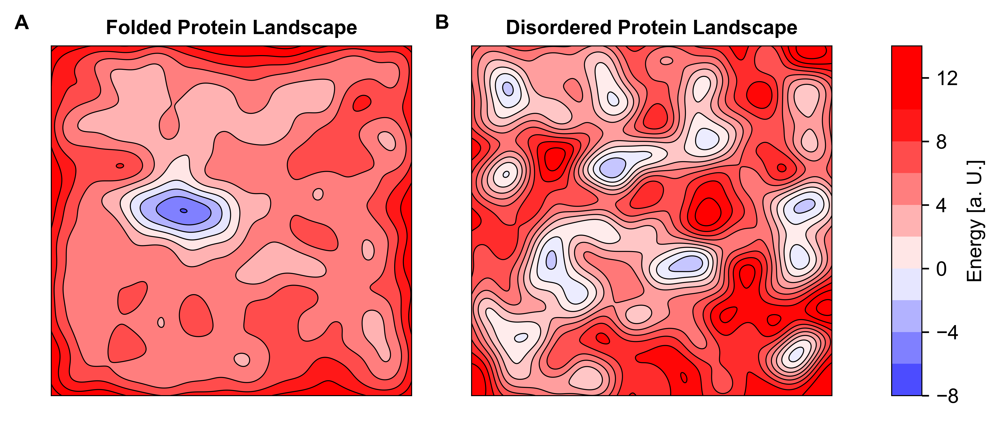

In [7]:
np.random.seed(123)
cmap = "bwr"
fig, axd = plt.subplot_mosaic("ABC",
                              figsize=(7,3),
                              facecolor="w",
                              dpi=300,
                              gridspec_kw={'width_ratios': [3,3,0.25]})

for ax in axd:
    if ax == "A":
        x = np.linspace(0, 100, 500)
        y = np.linspace(0, 100, 500)

        X, Y = np.meshgrid(x, y)
        Z = np.full((500, 500), 15, dtype=float)
        Z += gaussian_noise(X,Y,gaussians_per_axis=1,
                           height_range=[-13,-12],
                           width_range=[6,11],
                           rigidity=0)
        Z += gaussian_noise(X,Y,gaussians_per_axis=30,
                           height_range=[-2,0.25],
                           width_range=[4,5],
                          rigidity=0)
        axd[ax].set_title("Folded Protein Landscape",fontsize=10,fontweight="bold")
        c1 = axd[ax].contourf(X,Y,Z,10,zorder=0,cmap=cmap,vmin=-10,vmax=10)
        c2 = axd[ax].contour(X,Y,Z,10,colors=["black"]*10,linewidths=0.5)
    elif ax =="B":
        # np.random.seed(55)
        Z = np.full((500, 500), 10, dtype=float)
        Z += gaussian_noise(X,Y,gaussians_per_axis=4,
                           height_range=[-6,-5],
                           width_range=[5,9],
                           rigidity=0)
        Z += gaussian_noise(X,Y,gaussians_per_axis=15,
                           height_range=[-5,3],
                           width_range=[4,5],
                          rigidity=0)
        axd[ax].set_title("Disordered Protein Landscape",fontsize=10,fontweight="bold")
        # plt.contour(X,Y,Z,5,cmap="bwr")
        c3 = axd[ax].contourf(X,Y,Z,10,zorder=0,cmap=cmap,vmin=-10,vmax=10)
        c4 = axd[ax].contour(X,Y,Z,10,colors=["black"]*10,linewidths=0.5)
    elif ax == "C":
        fig.colorbar(c1,cax=axd["C"],label="Energy [a. U.]")
        
for ax in axd:    
    if ax != "C":
        trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
        axd[ax].set_xticks([])
        axd[ax].set_yticks([])
        axd[ax].text(0.05, 1.05, ax, transform=axd[ax].transAxes+trans,
                fontsize=10, fontweight='bold', va='top', ha='right')
        
plt.tight_layout()

os.makedirs(f"{fig_path}/fig1/pdfs",exist_ok=True)


plt.savefig(f"{fig_path}/fig1/pdfs/landscape_comparison.pdf",dpi=300)
# cax,kw = matplotlib.colorbar.make_axes([ax for ax in axd.values()])
# fig.colorbar(c3, ax=[axd["A"],axd["B"]])

# Figure 2

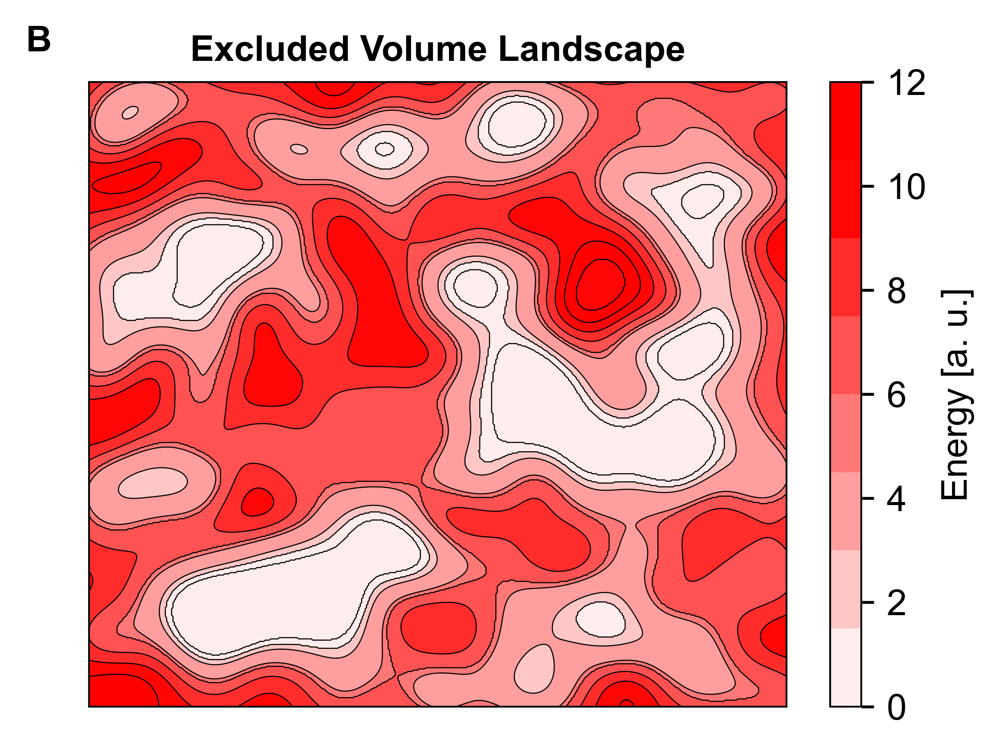

In [8]:
fontsize=10
np.random.seed(123456)

fig,ax = plt.subplots(figsize=(4,3),facecolor="w",dpi=300)

Z_ev = np.full((500, 500), 10, dtype=float)

Z_ev += gaussian_noise(X,Y,gaussians_per_axis=4,
                   height_range=[-6,-4],
                   width_range=[5,9],
                   rigidity=0)
Z_ev += gaussian_noise(X,Y,gaussians_per_axis=15,
                   height_range=[-5,3],
                   width_range=[4,5],
                  rigidity=0)

Z_ev[Z_ev > 12] = 10
Z_ev[(Z_ev < 2) | (Z_ev > 4) & (Z_ev < 6)] -= 1
Z_ev[Z_ev < 0] = 0

c5 = ax.contourf(X,Y,Z_ev,10,cmap="bwr",vmin=-10,vmax=10)
ax.contour(X,Y,Z_ev,10,colors=["black"]*10,linewidths=0.3)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Excluded Volume Landscape",fontweight="bold",fontsize=fontsize)
fig.colorbar(c5,label="Energy [a. u.]",ticks=np.arange(0,14,2))


trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
ax.text(0.05, 1.05, "B", transform=ax.transAxes+trans,
                fontsize=fontsize, fontweight='bold', va='top', ha='right')
plt.tight_layout()

os.makedirs(f"{fig_path}/fig2/pdfs/",exist_ok=True)
plt.savefig(f"{fig_path}/fig2/pdfs/ev_landscape.pdf",dpi=300)
plt.show()


# Figure 3

All diagrams and flow charts were made using vector graphics software such as affinity designer, adobe illustrator, and inkscape.

# Figure 4

In [10]:
traj_paths, top_paths= find_trajectory_files("simulations/fs/", num_replicates=10)
ev_traj_paths, ev_top_paths = find_trajectory_files("simulations/fs-ev/", num_replicates=10)

fs_qual = SamplingQuality(
    traj_paths,
    ev_traj_paths,
    top_file=top_paths[0],
    ref_top=ev_top_paths[0],
    method="2D angle distributions",
)

metric shape:  (20, 21)


(<Figure size 2800x2000 with 4 Axes>,
 {'A': <Axes: label='A', title={'center': 'Comparison to the Excluded Volume Limit'}, ylabel="Hellinger's Distance">,
  'B': <Axes: label='B', title={'center': 'All-to-All Trajectory Comparison'}, ylabel="Hellinger's Distance">,
  'C': <Axes: label='C', xlabel='Residue', ylabel="Hellinger's Distance\nmax - min">,
  'D': <Axes: label='D', xlabel='Residue', ylabel='Fractional Helicity'>})

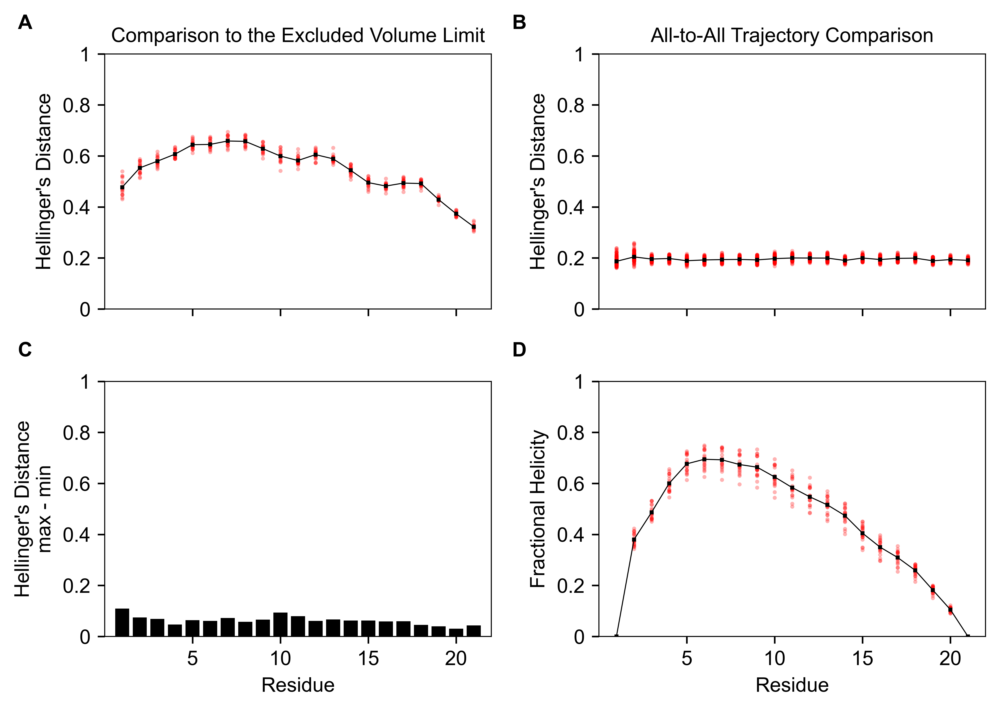

In [11]:
fs_qual.quality_plot(panel_labels=True)

## Changing the bin width

Note bin width == 5

In [4]:
os.chdir("/work/j.lotthammer/projects/fs-peptide/fs/")
traj_paths, top_paths,  = find_trajectory_files("simulations/fs",num_replicates=10)
ev_traj_paths, ev_top_paths,  = find_trajectory_files("simulations/fs-ev/",num_replicates=10)

fs_qual = SamplingQuality(traj_paths, ev_traj_paths, 
                       top_file=top_paths[0],
                       ref_top=ev_top_paths[0],
                       method="2D angle distributions",
                         bwidth=np.deg2rad(5))

AABB;CCDD
(20, 21)


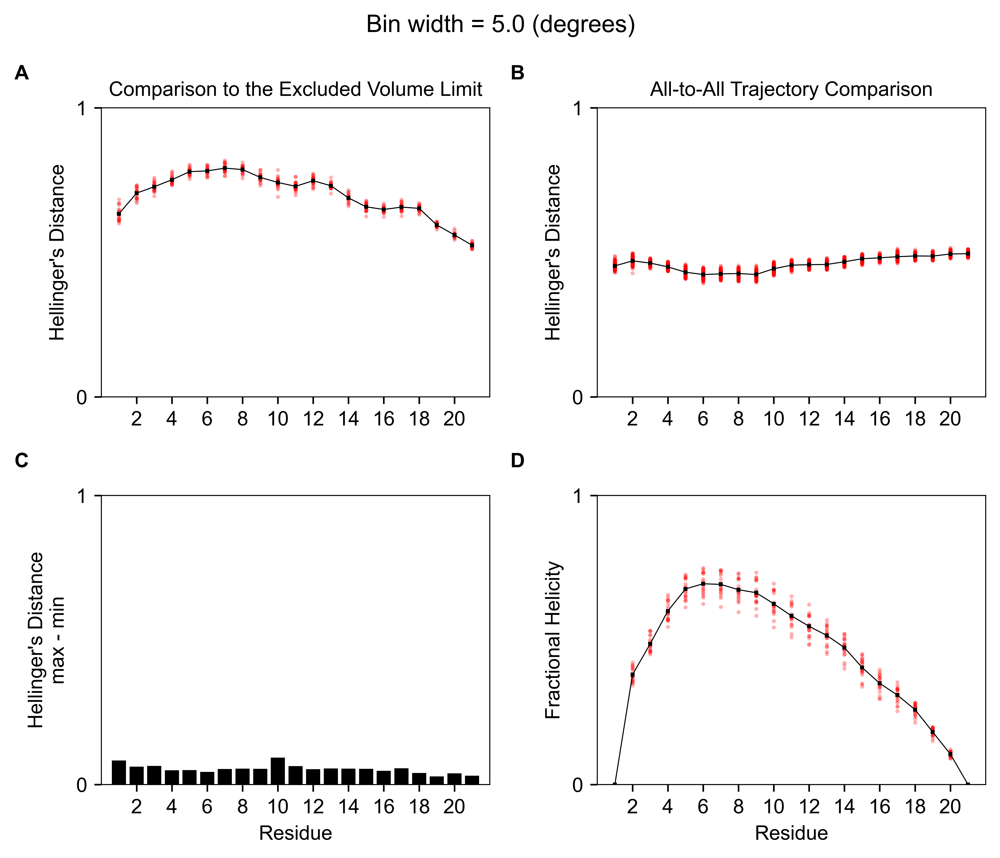

In [22]:
fig, ax = simple_plotter(fs_qual, figsize=(7,6),
                        increment=2,
                        panel_labels="""AABB;CCDD""",
                        fontsize=10,
                        dihedral="2D",
                        system="fs_qual",
                        save_dir=f"{fig_path}/fig4/pdfs",
                        figname=f"{round(np.rad2deg(fs_qual.bwidth),2)}",
                        title=True
                        )


60 bin width

In [23]:
os.chdir("/work/j.lotthammer/projects/fs-peptide/fs/")
traj_paths, top_paths,  = find_trajectory_files("./",num_replicates=10)
ev_traj_paths, ev_top_paths,  = find_trajectory_files("../ev/",num_replicates=10)

fs_qual = SamplingQuality(traj_paths, ev_traj_paths, 
                       top_file=top_paths[0],
                       ref_top=ev_top_paths[0],
                       method="2D angle distributions",
                         bwidth=np.deg2rad(60))

AABB;CCDD
(20, 21)


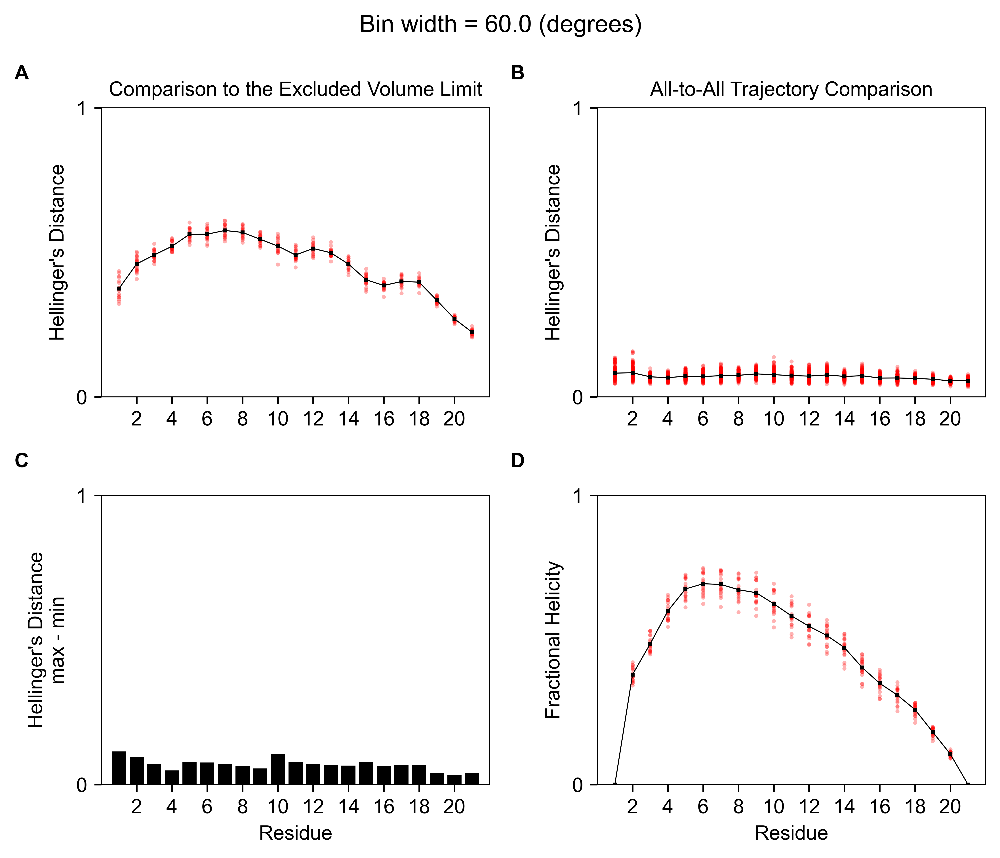

In [24]:
fig, ax = simple_plotter(fs_qual, figsize=(7,6),
                        increment=2,
                        panel_labels="""AABB;CCDD""",
                        fontsize=10,
                        dihedral="2D",
                        system="fs_qual",
                        save_dir=f"{fig_path}/fig4/pdfs",
                        figname=f"{round(np.rad2deg(fs_qual.bwidth),2)}",
                        title=True
                        )


bin width == 120 

In [25]:
os.chdir("/work/j.lotthammer/projects/fs-peptide/fs/")
traj_paths, top_paths,  = find_trajectory_files("./",num_replicates=10)
ev_traj_paths, ev_top_paths,  = find_trajectory_files("../ev/",num_replicates=10)

fs_qual = SamplingQuality(traj_paths, ev_traj_paths, 
                       top_file=top_paths[0],
                       ref_top=ev_top_paths[0],
                       method="2D angle distributions",
                         bwidth=np.deg2rad(120))

AABB;CCDD
(20, 21)


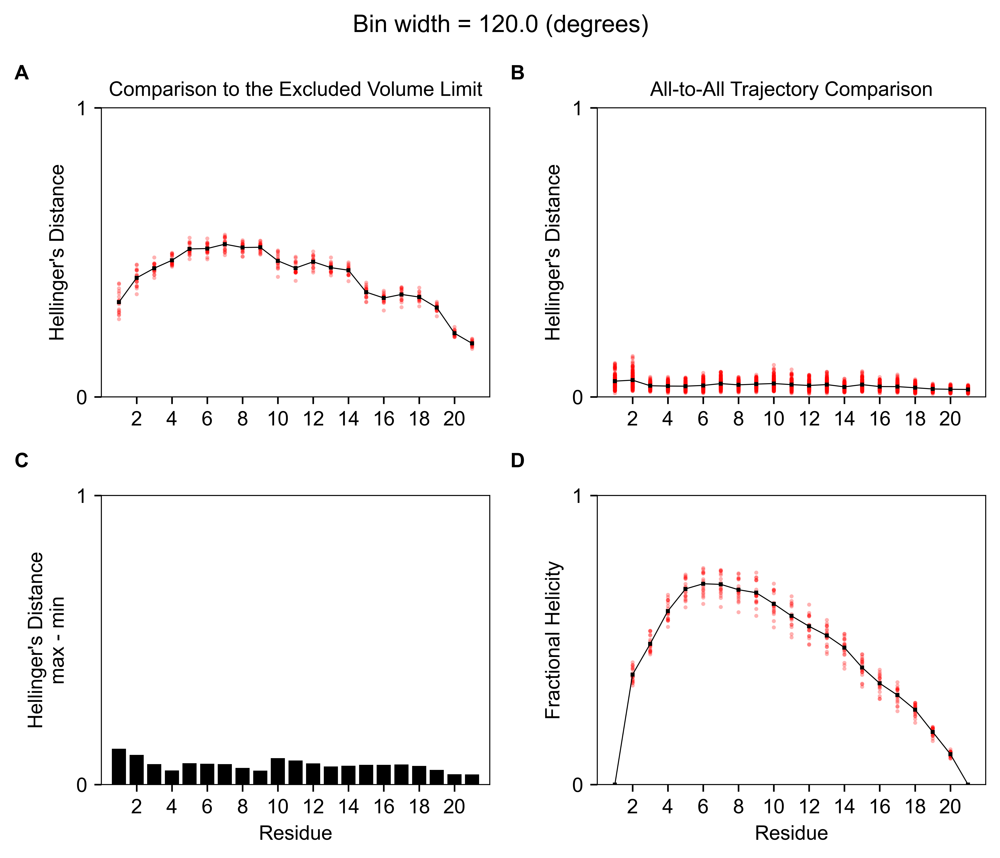

In [26]:
fig, ax = simple_plotter(fs_qual, figsize=(7,6),
                        increment=2,
                        panel_labels="""AABB;CCDD""",
                        fontsize=10,
                        dihedral="2D",
                        system="fs_qual",
                        save_dir=f"{fig_path}/fig4/pdfs",
                        figname=f"{round(np.rad2deg(fs_qual.bwidth),2)}",
                        title=True
                        )


In [129]:
print(f"{fig_path}/fig4/pdfs")

/work/j.lotthammer/jlotthammer/manuscripts/2022/sampling_quality/figures/fig4/pdfs


# Figure 5

In [8]:
fs_fixed_traj_paths, fs_fixed_top_paths, = find_trajectory_files("simulations/fs-fixed",10,exclude_dirs=["input_files","eq"])

fs_ev_traj_paths, fs_ev_top_paths,  = find_trajectory_files("simulations/fs-ev",10)

In [9]:
fs_fixed = SamplingQuality(fs_fixed_traj_paths, fs_ev_traj_paths, top_file=fs_fixed_top_paths[0],
                                    ref_top=fs_ev_top_paths[0],method="2D angle distributions")


(20, 21)


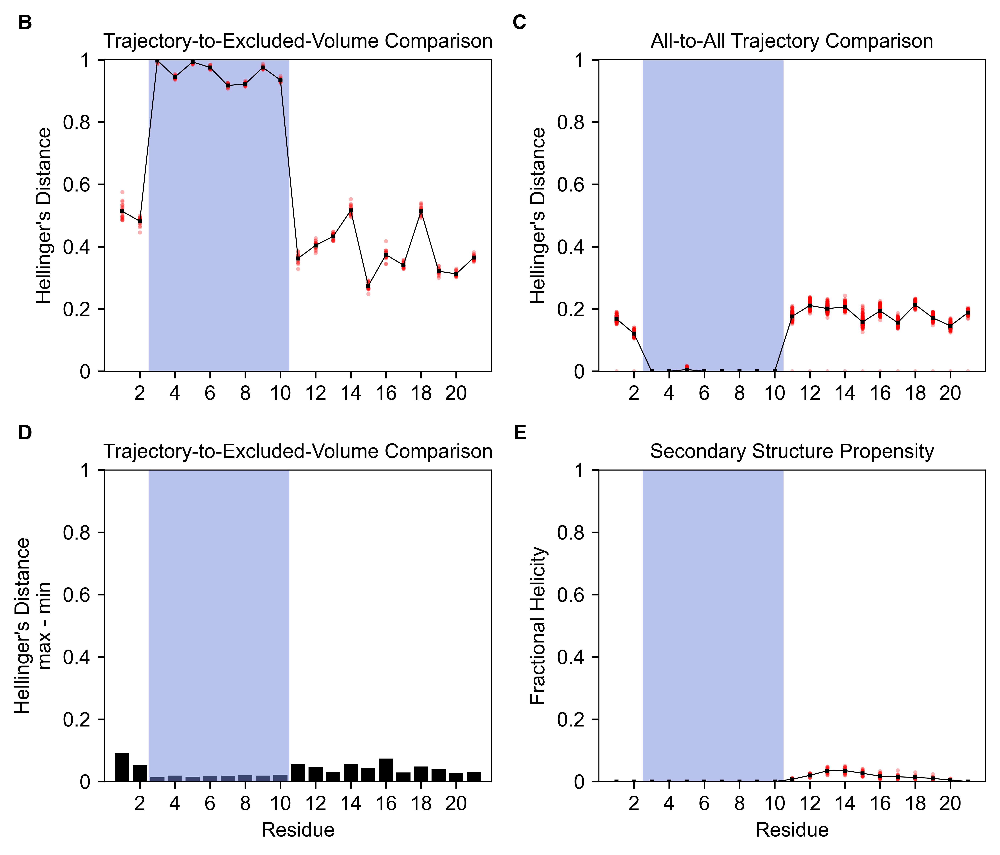

In [27]:
fig,ax = quality_plot_with_annotations(fs_fixed,
                        increment=2,
                        dihedral="2D",
                        figsize=(7,6),
                        fontsize=10,
                        system="fs_fixed",
                        x1=2.5,
                        x2=10.5,
                        color="#7689de",
                        save_dir=f"{fig_path}/fig5/pdfs")


# Figure 6

In [15]:
polyGV_traj_paths, polyGV_top_paths,  = find_trajectory_files("simulations/polyGV-PGSK/full/",20)

polyGV_ev_traj_paths,polyGV_ev_top_paths = find_trajectory_files("simulations/polyGV-PGSK/ev/",20)

polyGV_qual = SamplingQuality(polyGV_traj_paths, 
                              polyGV_ev_traj_paths,
                              top_file=polyGV_top_paths[0],
                              ref_top=polyGV_ev_top_paths[0],
                              method="2D angle distributions",
                              truncate=True)

Successfully truncated.
                The shortest trajectory is: 3200 frames.                All trajectories truncated to 3200


## Figure 6B scaling map analysis

In [16]:
hm_scaling_map = np.array([traj.proteinTrajectoryList[0].get_distance_map()[0] for traj in tqdm(polyGV_qual.trajs)])
ev_scaling_map = np.array([traj.proteinTrajectoryList[0].get_distance_map()[0] for traj in tqdm(polyGV_qual.ref_trajs)])
average_distance_map = np.mean(hm_scaling_map,axis=0)
ev_average_distance_map = np.mean(ev_scaling_map,axis=0)

  0%|                                                                                 | 0/20 [00:00<?, ?it/s]

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.
STATUS: On protein residue 0 (overall residue index = 1) of 80 [distance calculations]
STATUS: On protein residue 1 (overall residue index = 2) of 80 [distance calculations]
STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80

  5%|███▋                                                                     | 1/20 [00:00<00:04,  3.96it/s]

STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein residue 45 (overall residue index = 46) of 80 [distance calculations]
STATUS: On protein residue 46 (overall residue index = 47) of 80 [distance calculations]
STATUS: On protein residue 47 (overall residue index = 48) of 80 [distance calculations]
STATUS: On protein residue 48 (overall residue index = 49) of 80 [distance calculations]
STATUS: On protein residue 49 (overall residue index = 50) of 80 [distance calculations]
STATUS: On protein residue 50 (overall residue index = 51) of 80 [distance calculations]
STATUS: On protein residue 51 (overall residue index = 52) of 80 [distance calculations]
STATUS: On protein residue 52 (overall residue index = 53) of 80 [distance calculations]
STATUS: On protein re

 10%|███████▎                                                                 | 2/20 [00:00<00:04,  4.04it/s]

STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein residue 45 (overall residue index = 46) of 80 [distance calculations]
STATUS: On protein residue 46 (overall residue index = 47) of 80 [distance calculations]
STATUS: On protein residue 47 (overall residue index = 48) of 80 [distance calculations]
STATUS: On protein re

 15%|██████████▉                                                              | 3/20 [00:00<00:03,  4.27it/s]

STATUS: On protein residue 24 (overall residue index = 25) of 80 [distance calculations]
STATUS: On protein residue 25 (overall residue index = 26) of 80 [distance calculations]
STATUS: On protein residue 26 (overall residue index = 27) of 80 [distance calculations]
STATUS: On protein residue 27 (overall residue index = 28) of 80 [distance calculations]
STATUS: On protein residue 28 (overall residue index = 29) of 80 [distance calculations]
STATUS: On protein residue 29 (overall residue index = 30) of 80 [distance calculations]
STATUS: On protein residue 30 (overall residue index = 31) of 80 [distance calculations]
STATUS: On protein residue 31 (overall residue index = 32) of 80 [distance calculations]
STATUS: On protein residue 32 (overall residue index = 33) of 80 [distance calculations]
STATUS: On protein residue 33 (overall residue index = 34) of 80 [distance calculations]
STATUS: On protein residue 34 (overall residue index = 35) of 80 [distance calculations]
STATUS: On protein re

 20%|██████████████▌                                                          | 4/20 [00:00<00:03,  4.39it/s]

STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein residue 23 (overall residue index = 24) of 80 [distance calculations]
STATUS: On protein residue 24 (overall residue index = 25) of 80 [distance calculations]
STATUS: On protein residue 25 (overall residue index = 26) of 80 [distance calculations]
STATUS: On protein residue 26 (overall residue index = 27) of 80 [distance calculations]
STATUS: On protein residue 27 (overall residue index = 28) of 80 [distance calculations]
STATUS: On protein residue 28 (overall residue index = 29) of 80 [distance calculations]
STATUS: On protein residue 29 (overall residue index = 30) of 80 [distance calculations]
STATUS: On protein residue 30 (overall residue index = 31) of 80 [distance calculations]
STATUS: On protein re

 25%|██████████████████▎                                                      | 5/20 [00:01<00:03,  4.46it/s]

STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein residue 23 (overall residue index = 24) of 80 [distance calculations]
STATUS: On protein residue 24 (overall residue index = 25) of 80 [distance calculations]
STATUS: On protein residue 25 (overall residue index = 26) of 80 [distance calculations]
STATUS: On protein residue 26 (overall residue index = 27) of 80 [distance calculations]
STATUS: On protein residue 27 (overall residue index = 28) of 80 [distance calculations]
STATUS: On protein re

 30%|█████████████████████▉                                                   | 6/20 [00:01<00:03,  4.37it/s]

STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein re

 35%|█████████████████████████▌                                               | 7/20 [00:01<00:02,  4.45it/s]

STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue

 40%|█████████████████████████████▏                                           | 8/20 [00:01<00:02,  4.50it/s]

STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 

 45%|████████████████████████████████▊                                        | 9/20 [00:02<00:02,  4.54it/s]

STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (ove

 50%|████████████████████████████████████                                    | 10/20 [00:02<00:02,  4.62it/s]

STATUS: On protein residue 1 (overall residue index = 2) of 80 [distance calculations]
STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall

 55%|███████████████████████████████████████▌                                | 11/20 [00:02<00:01,  4.75it/s]

STATUS: On protein residue 0 (overall residue index = 1) of 80 [distance calculations]
STATUS: On protein residue 1 (overall residue index = 2) of 80 [distance calculations]
STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall r

 60%|███████████████████████████████████████████▏                            | 12/20 [00:02<00:01,  4.85it/s]

STATUS: On protein residue 1 (overall residue index = 2) of 80 [distance calculations]
STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall

 65%|██████████████████████████████████████████████▊                         | 13/20 [00:02<00:01,  4.92it/s]

STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overa

 70%|██████████████████████████████████████████████████▍                     | 14/20 [00:03<00:01,  4.98it/s]

STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (o

 75%|██████████████████████████████████████████████████████                  | 15/20 [00:03<00:00,  5.01it/s]

STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 1

 80%|█████████████████████████████████████████████████████████▌              | 16/20 [00:03<00:00,  5.03it/s]

STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein resid

 85%|█████████████████████████████████████████████████████████████▏          | 17/20 [00:03<00:00,  5.05it/s]

STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall residue index = 12) of 80 [distance calculations]
STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein re

 90%|████████████████████████████████████████████████████████████████▊       | 18/20 [00:03<00:00,  5.06it/s]

STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein re

 95%|████████████████████████████████████████████████████████████████████▍   | 19/20 [00:04<00:00,  4.94it/s]

STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein residue 23 (overall residue index = 24) of 80 [distance calculations]
STATUS: On protein residue 24 (overall residue index = 25) of 80 [distance calculations]
STATUS: On protein re


00%|████████████████████████████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.73it/s]

STATUS: On protein residue 12 (overall residue index = 13) of 80 [distance calculations]
STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein re

  0%|                                                                                 | 0/20 [00:00<?, ?it/s]

STATUS: On protein residue 0 (overall residue index = 1) of 80 [distance calculations]
STATUS: On protein residue 1 (overall residue index = 2) of 80 [distance calculations]
STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall residue index = 10) of 80 [distance calculations]
STATUS: On protein residue 10 (overall residue index = 11) of 80 [distance calculations]
STATUS: On protein residue 11 (overall r

  5%|███▋                                                                     | 1/20 [00:00<00:04,  3.96it/s]

STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein residue 45 (overall residue index = 46) of 80 [distance calculations]
STATUS: On protein residue 46 (overall residue index = 47) of 80 [distance calculations]
STATUS: On protein residue 47 (overall residue index = 48) of 80 [distance calculations]
STATUS: On protein residue 48 (overall residue index = 49) of 80 [distance calculations]
STATUS: On protein residue 49 (overall residue index = 50) of 80 [distance calculations]
STATUS: On protein residue 50 (overall residue index = 51) of 80 [distance calculations]
STATUS: On protein residue 51 (overall residue index = 52) of 80 [distance calculations]
STATUS: On protein residue 52 (overall residue index = 53) of 80 [distance calculations]
STATUS: On protein re

 10%|███████▎                                                                 | 2/20 [00:00<00:04,  4.32it/s]

STATUS: On protein residue 68 (overall residue index = 69) of 80 [distance calculations]
STATUS: On protein residue 69 (overall residue index = 70) of 80 [distance calculations]
STATUS: On protein residue 70 (overall residue index = 71) of 80 [distance calculations]
STATUS: On protein residue 71 (overall residue index = 72) of 80 [distance calculations]
STATUS: On protein residue 72 (overall residue index = 73) of 80 [distance calculations]
STATUS: On protein residue 73 (overall residue index = 74) of 80 [distance calculations]
STATUS: On protein residue 74 (overall residue index = 75) of 80 [distance calculations]
STATUS: On protein residue 75 (overall residue index = 76) of 80 [distance calculations]
STATUS: On protein residue 76 (overall residue index = 77) of 80 [distance calculations]
STATUS: On protein residue 77 (overall residue index = 78) of 80 [distance calculations]
STATUS: On protein residue 78 (overall residue index = 79) of 80 [distance calculations]
STATUS: On protein re

 15%|██████████▉                                                              | 3/20 [00:00<00:03,  4.45it/s]

STATUS: On protein residue 56 (overall residue index = 57) of 80 [distance calculations]
STATUS: On protein residue 57 (overall residue index = 58) of 80 [distance calculations]
STATUS: On protein residue 58 (overall residue index = 59) of 80 [distance calculations]
STATUS: On protein residue 59 (overall residue index = 60) of 80 [distance calculations]
STATUS: On protein residue 60 (overall residue index = 61) of 80 [distance calculations]
STATUS: On protein residue 61 (overall residue index = 62) of 80 [distance calculations]
STATUS: On protein residue 62 (overall residue index = 63) of 80 [distance calculations]
STATUS: On protein residue 63 (overall residue index = 64) of 80 [distance calculations]
STATUS: On protein residue 64 (overall residue index = 65) of 80 [distance calculations]
STATUS: On protein residue 65 (overall residue index = 66) of 80 [distance calculations]
STATUS: On protein residue 66 (overall residue index = 67) of 80 [distance calculations]
STATUS: On protein re

 20%|██████████████▌                                                          | 4/20 [00:00<00:03,  4.52it/s]

STATUS: On protein residue 48 (overall residue index = 49) of 80 [distance calculations]
STATUS: On protein residue 49 (overall residue index = 50) of 80 [distance calculations]
STATUS: On protein residue 50 (overall residue index = 51) of 80 [distance calculations]
STATUS: On protein residue 51 (overall residue index = 52) of 80 [distance calculations]
STATUS: On protein residue 52 (overall residue index = 53) of 80 [distance calculations]
STATUS: On protein residue 53 (overall residue index = 54) of 80 [distance calculations]
STATUS: On protein residue 54 (overall residue index = 55) of 80 [distance calculations]
STATUS: On protein residue 55 (overall residue index = 56) of 80 [distance calculations]
STATUS: On protein residue 56 (overall residue index = 57) of 80 [distance calculations]
STATUS: On protein residue 57 (overall residue index = 58) of 80 [distance calculations]
STATUS: On protein residue 58 (overall residue index = 59) of 80 [distance calculations]
STATUS: On protein re

 25%|██████████████████▎                                                      | 5/20 [00:01<00:03,  4.56it/s]

STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein residue 45 (overall residue index = 46) of 80 [distance calculations]
STATUS: On protein residue 46 (overall residue index = 47) of 80 [distance calculations]
STATUS: On protein residue 47 (overall residue index = 48) of 80 [distance calculations]
STATUS: On protein residue 48 (overall residue index = 49) of 80 [distance calculations]
STATUS: On protein residue 49 (overall residue index = 50) of 80 [distance calculations]
STATUS: On protein residue 50 (overall residue index = 51) of 80 [distance calculations]
STATUS: On protein residue 51 (overall residue index = 52) of 80 [distance calculations]
STATUS: On protein residue 52 (overall residue index = 53) of 80 [distance calculations]
STATUS: On protein re

 30%|█████████████████████▉                                                   | 6/20 [00:01<00:03,  4.58it/s]

STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein residue 45 (overall residue index = 46) of 80 [distance calculations]
STATUS: On protein residue 46 (overall residue index = 47) of 80 [distance calculations]
STATUS: On protein residue 47 (overall residue index = 48) of 80 [distance calculations]
STATUS: On protein residue 48 (overall residue index = 49) of 80 [distance calculations]
STATUS: On protein re

 35%|█████████████████████████▌                                               | 7/20 [00:01<00:02,  4.60it/s]

STATUS: On protein residue 33 (overall residue index = 34) of 80 [distance calculations]
STATUS: On protein residue 34 (overall residue index = 35) of 80 [distance calculations]
STATUS: On protein residue 35 (overall residue index = 36) of 80 [distance calculations]
STATUS: On protein residue 36 (overall residue index = 37) of 80 [distance calculations]
STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein re

 40%|█████████████████████████████▏                                           | 8/20 [00:01<00:02,  4.72it/s]

STATUS: On protein residue 32 (overall residue index = 33) of 80 [distance calculations]
STATUS: On protein residue 33 (overall residue index = 34) of 80 [distance calculations]
STATUS: On protein residue 34 (overall residue index = 35) of 80 [distance calculations]
STATUS: On protein residue 35 (overall residue index = 36) of 80 [distance calculations]
STATUS: On protein residue 36 (overall residue index = 37) of 80 [distance calculations]
STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein re

 45%|████████████████████████████████▊                                        | 9/20 [00:01<00:02,  4.57it/s]

STATUS: On protein residue 34 (overall residue index = 35) of 80 [distance calculations]
STATUS: On protein residue 35 (overall residue index = 36) of 80 [distance calculations]
STATUS: On protein residue 36 (overall residue index = 37) of 80 [distance calculations]
STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein re

 50%|████████████████████████████████████                                    | 10/20 [00:02<00:02,  4.38it/s]

STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein residue 23 (overall residue index = 24) of 80 [distance calculations]
STATUS: On protein residue 24 (overall residue index = 25) of 80 [distance calculations]
STATUS: On protein re

 55%|███████████████████████████████████████▌                                | 11/20 [00:02<00:02,  4.44it/s]

STATUS: On protein residue 65 (overall residue index = 66) of 80 [distance calculations]
STATUS: On protein residue 66 (overall residue index = 67) of 80 [distance calculations]
STATUS: On protein residue 67 (overall residue index = 68) of 80 [distance calculations]
STATUS: On protein residue 68 (overall residue index = 69) of 80 [distance calculations]
STATUS: On protein residue 69 (overall residue index = 70) of 80 [distance calculations]
STATUS: On protein residue 70 (overall residue index = 71) of 80 [distance calculations]
STATUS: On protein residue 71 (overall residue index = 72) of 80 [distance calculations]
STATUS: On protein residue 72 (overall residue index = 73) of 80 [distance calculations]
STATUS: On protein residue 73 (overall residue index = 74) of 80 [distance calculations]
STATUS: On protein residue 74 (overall residue index = 75) of 80 [distance calculations]
STATUS: On protein residue 75 (overall residue index = 76) of 80 [distance calculations]
STATUS: On protein re

 60%|███████████████████████████████████████████▏                            | 12/20 [00:02<00:01,  4.50it/s]

STATUS: On protein residue 55 (overall residue index = 56) of 80 [distance calculations]
STATUS: On protein residue 56 (overall residue index = 57) of 80 [distance calculations]
STATUS: On protein residue 57 (overall residue index = 58) of 80 [distance calculations]
STATUS: On protein residue 58 (overall residue index = 59) of 80 [distance calculations]
STATUS: On protein residue 59 (overall residue index = 60) of 80 [distance calculations]
STATUS: On protein residue 60 (overall residue index = 61) of 80 [distance calculations]
STATUS: On protein residue 61 (overall residue index = 62) of 80 [distance calculations]
STATUS: On protein residue 62 (overall residue index = 63) of 80 [distance calculations]
STATUS: On protein residue 63 (overall residue index = 64) of 80 [distance calculations]
STATUS: On protein residue 64 (overall residue index = 65) of 80 [distance calculations]
STATUS: On protein residue 65 (overall residue index = 66) of 80 [distance calculations]
STATUS: On protein re

 65%|██████████████████████████████████████████████▊                         | 13/20 [00:02<00:01,  4.16it/s]

STATUS: On protein residue 46 (overall residue index = 47) of 80 [distance calculations]
STATUS: On protein residue 47 (overall residue index = 48) of 80 [distance calculations]
STATUS: On protein residue 48 (overall residue index = 49) of 80 [distance calculations]
STATUS: On protein residue 49 (overall residue index = 50) of 80 [distance calculations]
STATUS: On protein residue 50 (overall residue index = 51) of 80 [distance calculations]
STATUS: On protein residue 51 (overall residue index = 52) of 80 [distance calculations]
STATUS: On protein residue 52 (overall residue index = 53) of 80 [distance calculations]
STATUS: On protein residue 53 (overall residue index = 54) of 80 [distance calculations]
STATUS: On protein residue 54 (overall residue index = 55) of 80 [distance calculations]
STATUS: On protein residue 55 (overall residue index = 56) of 80 [distance calculations]
STATUS: On protein residue 56 (overall residue index = 57) of 80 [distance calculations]
STATUS: On protein re

 70%|██████████████████████████████████████████████████▍                     | 14/20 [00:03<00:01,  4.27it/s]

STATUS: On protein residue 35 (overall residue index = 36) of 80 [distance calculations]
STATUS: On protein residue 36 (overall residue index = 37) of 80 [distance calculations]
STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein residue 42 (overall residue index = 43) of 80 [distance calculations]
STATUS: On protein residue 43 (overall residue index = 44) of 80 [distance calculations]
STATUS: On protein residue 44 (overall residue index = 45) of 80 [distance calculations]
STATUS: On protein residue 45 (overall residue index = 46) of 80 [distance calculations]
STATUS: On protein re

 75%|██████████████████████████████████████████████████████                  | 15/20 [00:03<00:01,  4.37it/s]

STATUS: On protein residue 31 (overall residue index = 32) of 80 [distance calculations]
STATUS: On protein residue 32 (overall residue index = 33) of 80 [distance calculations]
STATUS: On protein residue 33 (overall residue index = 34) of 80 [distance calculations]
STATUS: On protein residue 34 (overall residue index = 35) of 80 [distance calculations]
STATUS: On protein residue 35 (overall residue index = 36) of 80 [distance calculations]
STATUS: On protein residue 36 (overall residue index = 37) of 80 [distance calculations]
STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein residue 38 (overall residue index = 39) of 80 [distance calculations]
STATUS: On protein residue 39 (overall residue index = 40) of 80 [distance calculations]
STATUS: On protein residue 40 (overall residue index = 41) of 80 [distance calculations]
STATUS: On protein residue 41 (overall residue index = 42) of 80 [distance calculations]
STATUS: On protein re

 80%|█████████████████████████████████████████████████████████▌              | 16/20 [00:03<00:00,  4.44it/s]

STATUS: On protein residue 27 (overall residue index = 28) of 80 [distance calculations]
STATUS: On protein residue 28 (overall residue index = 29) of 80 [distance calculations]
STATUS: On protein residue 29 (overall residue index = 30) of 80 [distance calculations]
STATUS: On protein residue 30 (overall residue index = 31) of 80 [distance calculations]
STATUS: On protein residue 31 (overall residue index = 32) of 80 [distance calculations]
STATUS: On protein residue 32 (overall residue index = 33) of 80 [distance calculations]
STATUS: On protein residue 33 (overall residue index = 34) of 80 [distance calculations]
STATUS: On protein residue 34 (overall residue index = 35) of 80 [distance calculations]
STATUS: On protein residue 35 (overall residue index = 36) of 80 [distance calculations]
STATUS: On protein residue 36 (overall residue index = 37) of 80 [distance calculations]
STATUS: On protein residue 37 (overall residue index = 38) of 80 [distance calculations]
STATUS: On protein re

 85%|█████████████████████████████████████████████████████████████▏          | 17/20 [00:03<00:00,  4.33it/s]

STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein residue 23 (overall residue index = 24) of 80 [distance calculations]
STATUS: On protein residue 24 (overall residue index = 25) of 80 [distance calculations]
STATUS: On protein residue 25 (overall residue index = 26) of 80 [distance calculations]
STATUS: On protein residue 26 (overall residue index = 27) of 80 [distance calculations]
STATUS: On protein residue 27 (overall residue index = 28) of 80 [distance calculations]
STATUS: On protein re

 90%|████████████████████████████████████████████████████████████████▊       | 18/20 [00:04<00:00,  4.40it/s]

STATUS: On protein residue 13 (overall residue index = 14) of 80 [distance calculations]
STATUS: On protein residue 14 (overall residue index = 15) of 80 [distance calculations]
STATUS: On protein residue 15 (overall residue index = 16) of 80 [distance calculations]
STATUS: On protein residue 16 (overall residue index = 17) of 80 [distance calculations]
STATUS: On protein residue 17 (overall residue index = 18) of 80 [distance calculations]
STATUS: On protein residue 18 (overall residue index = 19) of 80 [distance calculations]
STATUS: On protein residue 19 (overall residue index = 20) of 80 [distance calculations]
STATUS: On protein residue 20 (overall residue index = 21) of 80 [distance calculations]
STATUS: On protein residue 21 (overall residue index = 22) of 80 [distance calculations]
STATUS: On protein residue 22 (overall residue index = 23) of 80 [distance calculations]
STATUS: On protein residue 23 (overall residue index = 24) of 80 [distance calculations]
STATUS: On protein re

 95%|████████████████████████████████████████████████████████████████████▍   | 19/20 [00:04<00:00,  4.46it/s]

STATUS: On protein residue 77 (overall residue index = 78) of 80 [distance calculations]
STATUS: On protein residue 78 (overall residue index = 79) of 80 [distance calculations]
STATUS: On protein residue 0 (overall residue index = 1) of 80 [distance calculations]
STATUS: On protein residue 1 (overall residue index = 2) of 80 [distance calculations]
STATUS: On protein residue 2 (overall residue index = 3) of 80 [distance calculations]
STATUS: On protein residue 3 (overall residue index = 4) of 80 [distance calculations]
STATUS: On protein residue 4 (overall residue index = 5) of 80 [distance calculations]
STATUS: On protein residue 5 (overall residue index = 6) of 80 [distance calculations]
STATUS: On protein residue 6 (overall residue index = 7) of 80 [distance calculations]
STATUS: On protein residue 7 (overall residue index = 8) of 80 [distance calculations]
STATUS: On protein residue 8 (overall residue index = 9) of 80 [distance calculations]
STATUS: On protein residue 9 (overall r

100%|████████████████████████████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.44it/s]

STATUS: On protein residue 60 (overall residue index = 61) of 80 [distance calculations]
STATUS: On protein residue 61 (overall residue index = 62) of 80 [distance calculations]
STATUS: On protein residue 62 (overall residue index = 63) of 80 [distance calculations]
STATUS: On protein residue 63 (overall residue index = 64) of 80 [distance calculations]
STATUS: On protein residue 64 (overall residue index = 65) of 80 [distance calculations]
STATUS: On protein residue 65 (overall residue index = 66) of 80 [distance calculations]
STATUS: On protein residue 66 (overall residue index = 67) of 80 [distance calculations]
STATUS: On protein residue 67 (overall residue index = 68) of 80 [distance calculations]
STATUS: On protein residue 68 (overall residue index = 69) of 80 [distance calculations]
STATUS: On protein residue 69 (overall residue index = 70) of 80 [distance calculations]
STATUS: On protein residue 70 (overall residue index = 71) of 80 [distance calculations]
STATUS: On protein re

/tmp/ipykernel_857027/3156615447.py:5: RuntimeWarning: invalid value encountered in divide
  im = ax.imshow(average_distance_map / ev_average_distance_map, zorder=1)


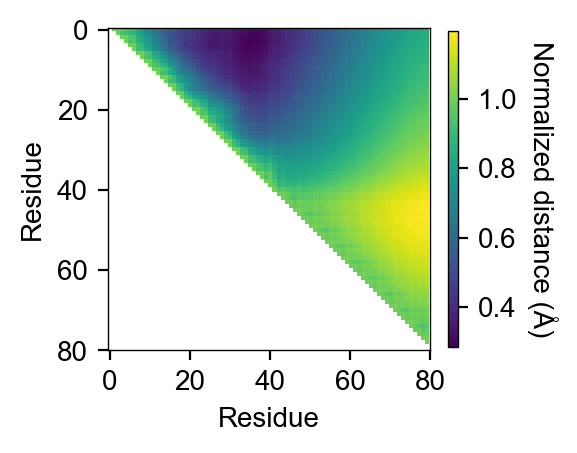

In [19]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(3,3))

# Display the image
im = ax.imshow(average_distance_map / ev_average_distance_map, zorder=1)

# Label axes
ax.set_xlabel("Residue")
ax.set_ylabel("Residue")

# Add colorbar at the top of the plot
cbar = plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.03, aspect=30)

# Set colorbar label
cbar.set_label("Normalized distance (Å)", rotation=270, labelpad=15)

# Set x-axis and y-axis labels in increments of 20
ax.set_xticks(np.arange(0, average_distance_map.shape[1]+1, 20))
ax.set_xticklabels(np.arange(0, average_distance_map.shape[1]+1, 20))

ax.set_yticks(np.arange(0, average_distance_map.shape[0]+1, 20))
ax.set_yticklabels(np.arange(0, average_distance_map.shape[0]+1, 20))

plt.tight_layout()

# Save the figure
os.makedirs(f"{fig_path}/fig6/pdfs/",exist_ok=True)
plt.savefig(f"{fig_path}/fig6/pdfs/polyGV_PGSK_scaling.pdf", dpi=300,bbox_inches='tight')


(20, 80)


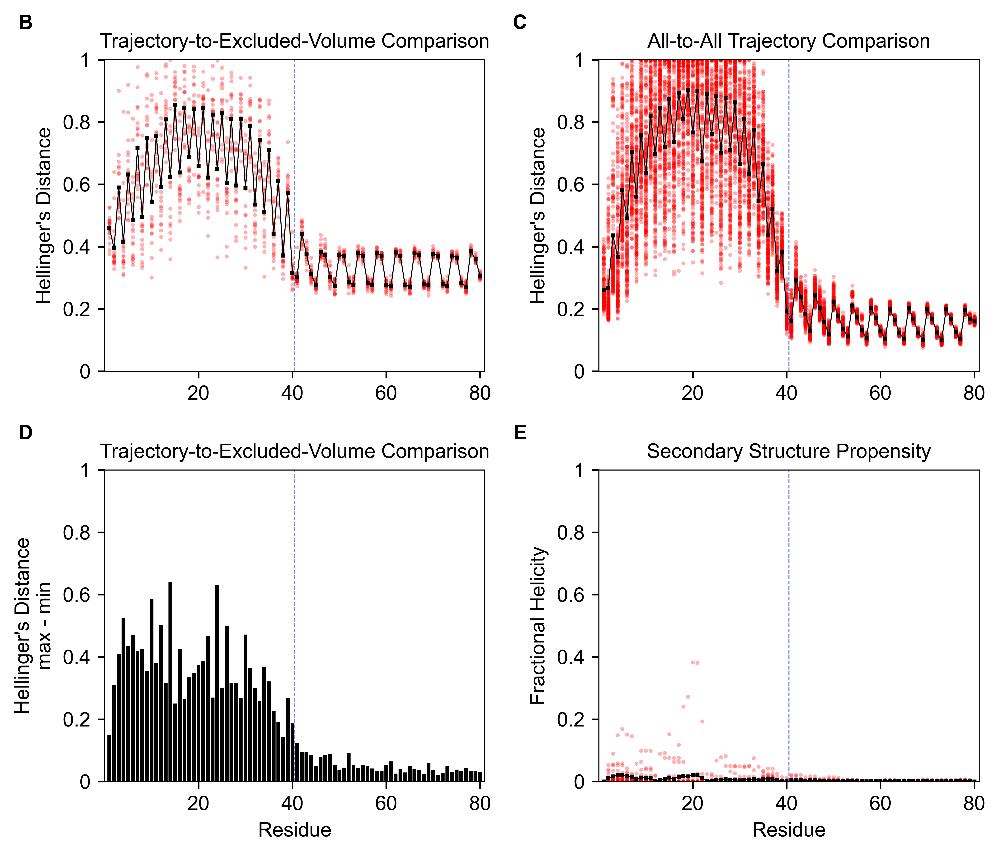

In [28]:
fig,ax = quality_plot_with_annotations(polyGV_qual,
                        increment=20,
                        dihedral="2D",
                        figsize=(7,6),
                        fontsize=10,
                        system="polyGV_PGSK",
                        x1=40.5,
                        color="#7689de",
                        save_dir=f"{fig_path}/fig6/pdfs")


Successfully truncated.
                The shortest trajectory is: 3200 frames.                All trajectories truncated to 3200
(20, 80)


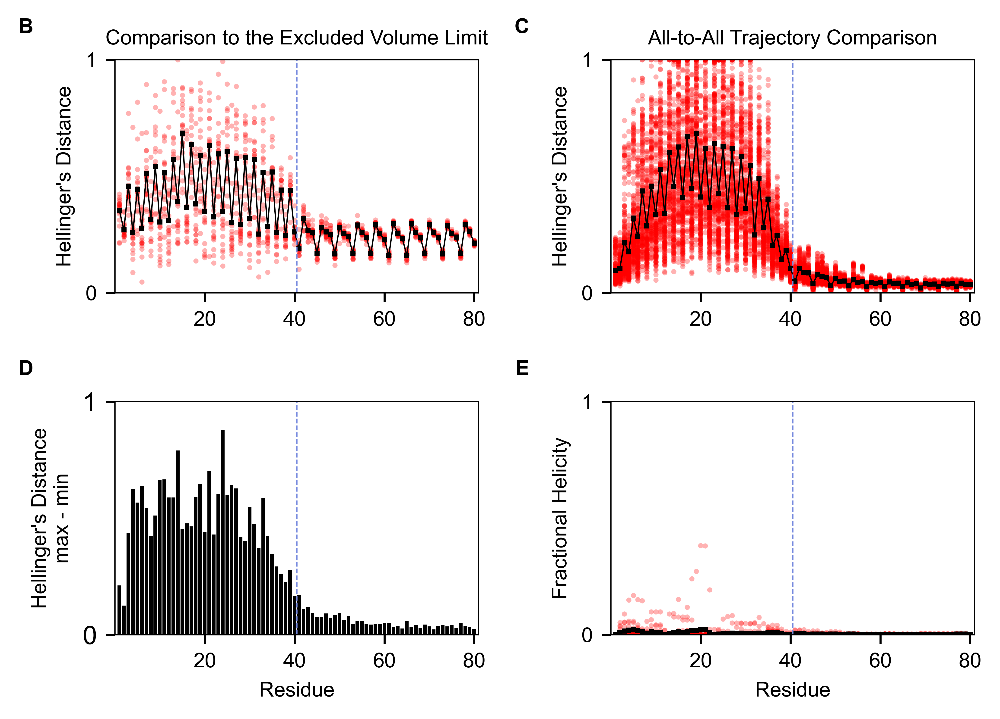

In [98]:

polyGV_qual = SamplingQuality(polyGV_traj_paths, polyGV_ev_traj_paths, top_file=polyGV_top_paths[0],
                                    ref_top=polyGV_ev_top_paths[0],method="1D angle distributions",truncate=True)

fig,ax = quality_plot_with_annotations(polyGV_qual,
                        increment=20,
                        dihedral="phi",
                        figsize=(5.5,4),
                        fontsize=8,
                        x1=40.5,
                        system="polyGV_PGSK",
                        color="#7689de",
                        save_dir=f"{fig_path}/fig6/pdfs")


(20, 80)


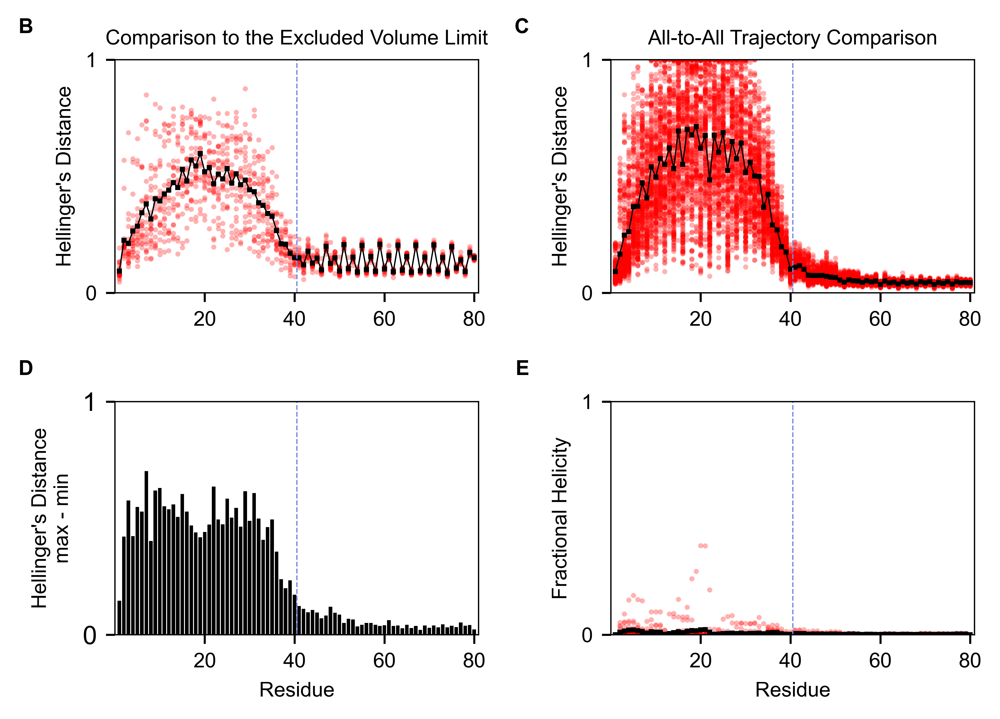

In [99]:

# polyGV_qual = SamplingQuality(polyGV_traj_paths, polyGV_ev_traj_paths, top_file=polyGV_top_paths[0],
#                                     ref_top=polyGV_ev_top_paths[0],method="1D angle distributions",truncate=True)

fig,ax = quality_plot_with_annotations(polyGV_qual,
                        increment=20,
                        dihedral="psi",
                        figsize=(5.5,4),
                        fontsize=8,
                        x1=40.5,
                        system="polyGV_PGSK",
                        color="#7689de",
                        save_dir=f"{fig_path}/fig6/pdfs")


# Figure 7

In [120]:
os.chdir("/work/bmb-svc-holehouse/for_others/for_jeff/2022/trajectories_to_use/ash1")

ash1_traj_paths,ash1_top_paths,  = find_trajectory_files("./full/",15)

ash1_ev_traj_paths,ash1_ev_top_paths,  = find_trajectory_files("ev/",15)

ash1_qual = SamplingQuality(ash1_traj_paths, ash1_ev_traj_paths, top_file=ash1_top_paths[0],
                                    ref_top=ash1_ev_top_paths[0],method="2D angle distributions",truncate=True)


Successfully truncated.
                The shortest trajectory is: 6000 frames.                All trajectories truncated to 6000


/work/j.lotthammer/packages/soursop/soursop/sssampling.py:38: RuntimeWarning: invalid value encountered in sqrt
  distance = np.sqrt(1 - b_coefficient)


(15, 83)

AABB;CCDD
(15, 83)


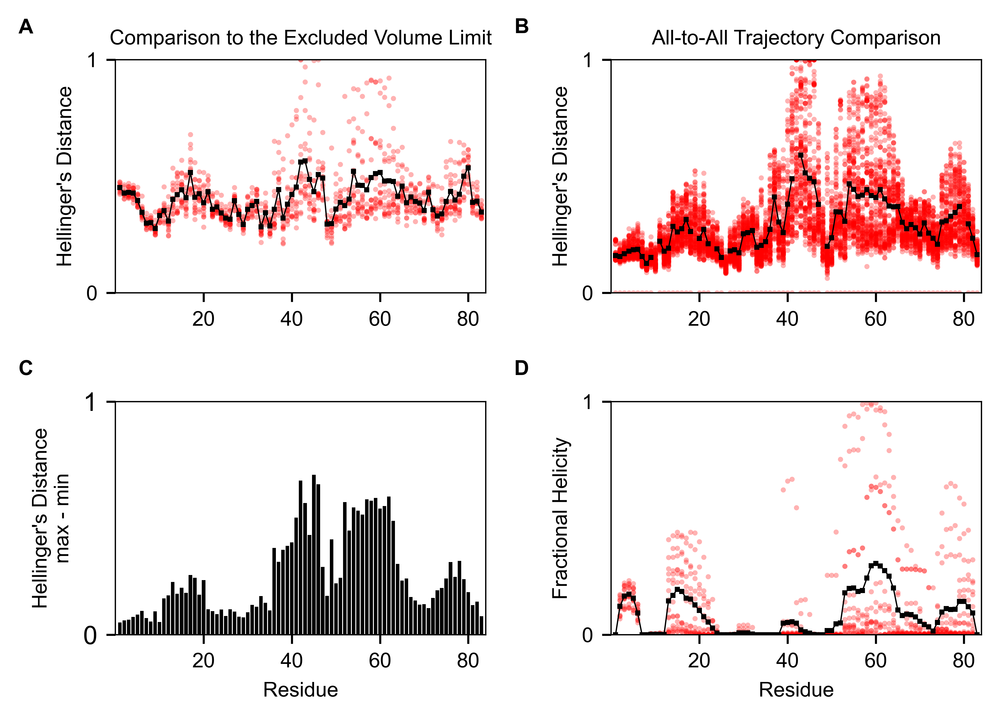

In [142]:
fig,ax = simple_plotter(ash1_qual,
                        panel_labels="""AABB;CCDD""",
                        figsize=(5.5,4),
                        increment=20,
                        fontsize=8,
                        dihedral="2D",
                        label_position=(-0.1,1.15),
                        save_dir=f"{fig_path}/fig8/pdfs/",
                        system="ash1",
                        )


## ASH1 MC sims

In [6]:
ash1_traj_paths,ash1_top_paths,  = find_trajectory_files("simulations/ash1_mc/mc/",15)

ash1_ev_traj_paths,ash1_ev_top_paths,  = find_trajectory_files("simulations/ash1_mc/mc/",15)

In [5]:
ash1_qual = SamplingQuality(ash1_traj_paths, ash1_ev_traj_paths, top_file=ash1_top_paths[0],
                                    ref_top=ash1_ev_top_paths[0],method="2D angle distributions",truncate=True)


Successfully truncated.
                The shortest trajectory is: 6000 frames.                All trajectories truncated to 6000


AABB;CCDD


/home/jlotthammer/packages/soursop/soursop/sssampling.py:41: RuntimeWarning: invalid value encountered in sqrt
  distance = np.sqrt(1 - b_coefficient)


(15, 83)


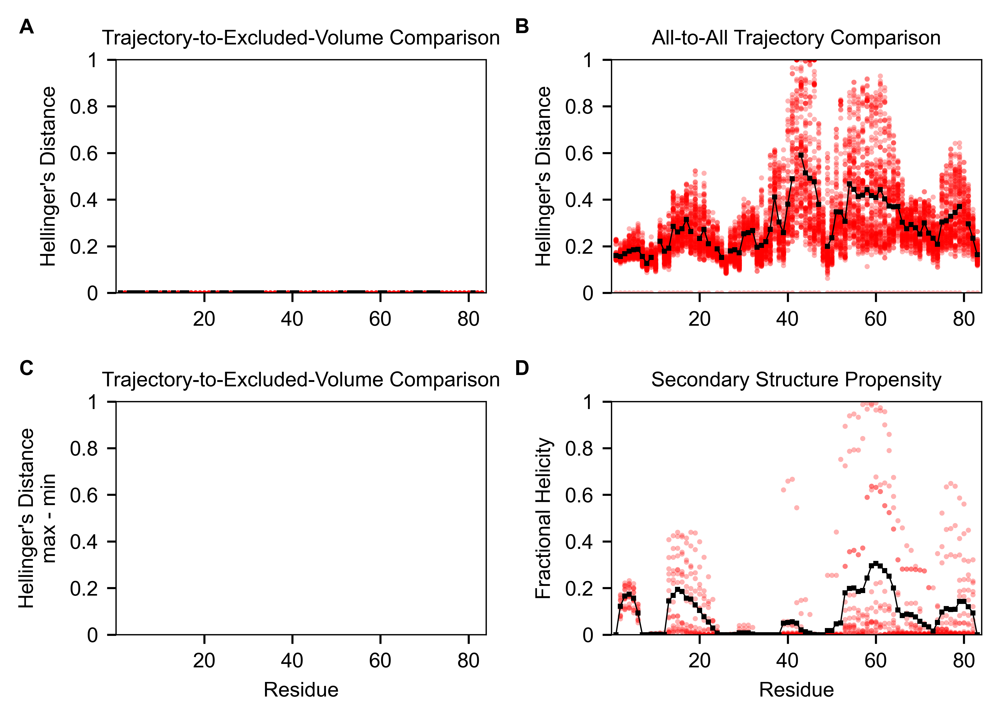

In [11]:
fig,ax = quality_plot_with_annotations(ash1_qual,
                        panel_labels="""AABB;CCDD""",
                        figsize=(5.5,4),
                        increment=20,
                        fontsize=8,
                        dihedral="2D",
                        label_position=(-0.1,1.15),
                        save_dir=f"{fig_path}/fig7/pdfs/",
                        system="ash1",
                        )


## NTD

In [13]:
ntd_traj_paths, ntd_top_paths,  = find_trajectory_files("simulations/ntd/full/",15,exclude_dirs=[str(x) for x in np.arange(16,21)])

ntd_ev_traj_paths, ntd_ev_top_paths,  = find_trajectory_files("simulations/ntd/ev/",15,exclude_dirs=[str(x) for x in np.arange(16,21)])
   
ntd_qual = SamplingQuality(ntd_traj_paths, ntd_ev_traj_paths, top_file=ntd_top_paths[0],
                                    ref_top=ntd_ev_top_paths[0],method="2D angle distributions",truncate=True)


Successfully truncated.
                The shortest trajectory is: 500 frames.                All trajectories truncated to 500


EEFF;GGHH
(15, 49)


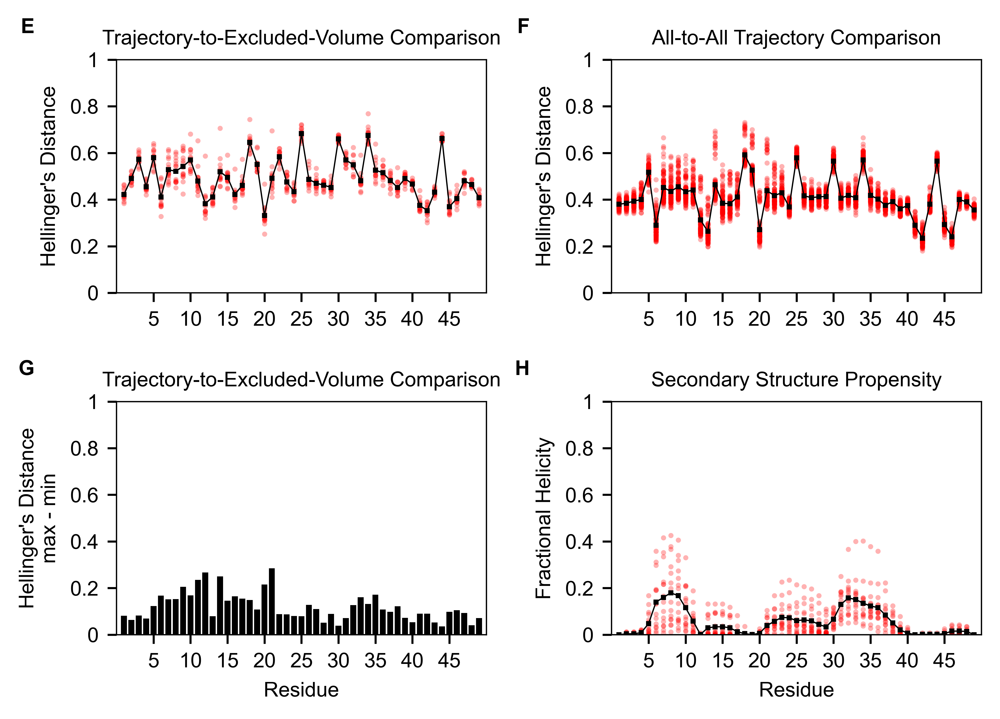

In [14]:
fig,ax = quality_plot_with_annotations(ntd_qual,
                        panel_labels="EEFF;GGHH",
                        figsize=(5.5,4),
                        fontsize=8,
                        increment=5,
                        dihedral="2D",
                        label_position=(-0.1,1.15),
                        save_dir=f"{fig_path}/fig7/pdfs/",
                        system="ntd",
                        )



In [ ]:
a